In [ ]:
!pip3 install agentpy

In [2]:
import agentpy as ap, numpy as np
from matplotlib import pyplot as plt
from IPython.display import HTML
import seaborn as sns, IPython
import pandas as pd

In [3]:
class MyAgent(ap.Agent):

    """Class to represent an agent that searchs for rewards"""
    def setup(self) -> None:
        """Initial setup"""
        self.energy = self.p.energy
        self.env = self.model.env
        self.moves = [(0,1),(0,-1),(1,0),(-1,0)]
        self.board = self.model.board
        self.target = None
        self.current_position = (0,0)
        self.next_move = None
        
    def get_position(self):
        return self.env.positions[self]

    
    def intent(self) -> None: 
        """Action for each step"""
        self.record('energy')
        self.current_position = self.get_position()
        if self.target is None or self.target == self.current_position:
            if self.target == self.current_position and self.env.room[self.current_position] != 0:
                self.board.rewards_picked += 1
                self.board.total_reward_value += self.env.room[self.current_position]
                self.energy += self.env.room[self.current_position]
                self.env.room[self.current_position] = 0
            self.get_target()
            others_with_same_target = list(filter(
        lambda ag: np.array_equal(ag.target, self.target), self.env.neighbors(self,100)))
            
            if len(others_with_same_target) > 0:
                self.get_target()
            
        else:
            self.get_next_move()
            others_with_same_next = list(filter(
    lambda ag: np.array_equal(ag.next_move, self.next_move) and ag != self, self.env.agents))
            
            other = None if len(others_with_same_next) == 0 else others_with_same_next[0]

            if other is not None:
                self.negotiate(other)

    def execute(self):
        self.current_position = self.get_position()
        if self.next_move is not None and self.energy > 0:
            self.env.move_to(self, self.next_move)
            self.energy -= 1
    
    def get_target(self):
        
        if len(self.board.rewards_list) > 0:
            closest_reward = min(self.board.rewards_list, key=lambda reward: abs(reward[1][0] - self.current_position[0]) + abs(reward[1][1] - self.current_position[1]))
            self.board.rewards_list.remove(closest_reward)
            self.target = closest_reward[1]

        else:
            self.target = None

    def get_next_move(self):
        move = (0,0)
        if self.target[0] > self.current_position[0]:
            move = (1,0)
        elif self.target[0] < self.current_position[0]:
            move = (-1,0)
        elif self.target[1] > self.current_position[1]:
            move = (0,1)
        elif self.target[1] < self.current_position[1]:
            move = (0,-1)
        
        self.next_move = (self.current_position[0] + move[0], self.current_position[1] + move[1])
        if tuple(self.next_move) in self.env.positions.values() or self.env.room[self.next_move] == -100:
            self.next_move = self.current_position
            for move in self.moves:
                next = (self.current_position[0] + move[0], self.current_position[1] + move[1])

                if 0 <= next[0] < len(self.env.room) and 0 <= next[1] < len(self.env.room[0]) and next not in self.env.positions.values() and self.env.room[next]:
                    self.next_move = next
                    break

    def has_energy(self):
        return self.energy > 0
    
    def send_message(self, other_agent, message):
        return other_agent.receive_message(self, message)

    def receive_message(self, other_agent, message):
        print(f'\nMessage from {self.id} to {other_agent.id}: {message}')
        print(f"Sure, I have {self.energy} energy left")
        return self.energy

    def negotiate(self, other_agent):
        message = "Hey, since we both need to move, the one with the least energy should go"
        other_energy = self.send_message(other_agent, message)
        
        # I have more energy, so I move
        if other_energy < self.energy:
            print("I'll move")
            self.adjust_position(self, other_agent)  
        else:
            print("You should move")
            self.adjust_position(other_agent, self)  
    
    def adjust_position(self, agent, other_agent):

        if agent.next_move == other_agent.next_move:

            if agent.next_move[0] == other_agent.next_move[0]:
                if agent.next_move[1] > other_agent.next_move[1]:
                    agent.next_move = (agent.current_position[0], agent.current_position[1] + 1)
                else:
                    agent.next_move = (agent.current_position[0], agent.current_position[1] - 1)
            elif agent.next_move[1] == other_agent.next_move[1]:
                if agent.next_move[0] > other_agent.next_move[0]:
                    agent.next_move = (agent.current_position[0] - 1, agent.current_position[1])
                else:
                    agent.next_move = (agent.current_position[0] + 1, agent.current_position[1])

class Room(ap.Grid):

    def setup(self):
        self.room = self.p.grid
        self.total_rewards = np.sum((self.room != 0) & (self.room != -100))
        print("total_rewards", self.total_rewards)

    def get_init_positions(self):
        grid_shape = self.room.shape
        rows, cols = grid_shape
        positions = []

        # Calculate the spacing in both row and column directions
        # We are using the square root of agent_count to get a roughly equal number of agents across rows and columns
        spacing_row = rows // int(np.sqrt(self.p.agent_count))  # Vertical spacing
        spacing_col = cols // int(np.sqrt(self.p.agent_count))  # Horizontal spacing

        # Ensure we don't exceed grid boundaries
        max_row = min(spacing_row, rows - 1)
        max_col = min(spacing_col, cols - 1)

        for i in range(self.p.agent_count):
            # Calculate row and column index for each agent
            row = (i // int(np.sqrt(self.p.agent_count))) * spacing_row
            col = (i % int(np.sqrt(self.p.agent_count))) * spacing_col
            
            # Adjust to ensure agents are within the grid
            row = min(row, rows - 1)
            col = min(col, cols - 1)

            positions.append((row, col))

        return positions


class InteractionModel(ap.Model):
    """Class to model a grid with rewards and agents"""
    def setup(self):
        self.env = Room(self, shape=grid.shape) 
        self.board = Board(self.p.grid)

        # Add agents and distribute them across the map
        self.agents = ap.AgentList(self, self.p.agent_count, MyAgent)
        positions = self.env.get_init_positions()
        self.env.add_agents(self.agents,positions=positions)

    def step(self):
        self.agents.execute()

    def update(self):
        self.agents.intent()
        # self.agents.record('energy')
        if self.board.rewards_picked == self.env.total_rewards: 
            print("Finished picking all rewards")
            self.stop()

    def end(self):
        self.record('reward', self.board.total_reward_value)
        

class Board():
    def __init__(self, grid):
        self.rewards_assigned = np.zeros(grid.shape)
        self.rewards_picked = 0
        self.total_reward_value = 0

        self.rewards_list = []
        for i in range(len(grid)): 
            for j in range(len(grid[i])):  
                value = grid[i][j]
                
                if value != 0 and value != -100:  
                    self.rewards_list.append((value, (i,j)))

        
grid = np.array([[0.0, 5.0, 0.0, -4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 
                 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -7.0, 2.0, 6.0, 3.0], 
                 [0.0, 0.0, -7.0, 8.0, 0.0, 0.0, 2.0, 0.0, 7.0, 1.0], 
                 [-2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 5.0, 0.0, -7.0, 0.0], 
                 [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 1.0, -9.0, 0.0, 0.0], 
                 [0.0, 7.0, 0.0, -7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0], 
                 [8.0, 0.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0], 
                 [0.0, 4.0, 6.0, 0.0, -8.0, 7.0, 0.0, 0.0, 0.0, 3.0], 
                 [0.0, 8.0, 0.0, 0.0, 3.0, 9.0, -9.0, 0.0, 3.0, 1.0], 
                 [0.0, 0.0, 0.0, 7.0, -7.0, 0.0, 0.0, 0.0, 0.0, 0.0]])

def add_obstacles(grid, n):
# Get the shape of the new_grid
    rows, cols = grid.shape
    new_grid = grid.copy()
    # List to keep track of the positions where obstacles will be placed
    placed_obstacles = 0
    
    while placed_obstacles < n:
        # Randomly select a position on the new_grid
        random_row = np.random.randint(0, rows)
        random_col = np.random.randint(0, cols)
        
        # Check if the selected position is not an obstacle and within bounds
        if new_grid[random_row, random_col] != -100.0:  # Not already an obstacle
            # Place an obstacle at the selected position
            new_grid[random_row, random_col] = -100.0
            placed_obstacles += 1
    return new_grid

parameters = {
    'steps': 40,
    'energy': 15,
    'grid': grid,
    'agent_count': 5,
    'obstacles': 5
}
grid = add_obstacles(grid, parameters['obstacles'])

def my_plot(model, ax):
    grid1 = model.env.room.copy()
    ax.clear()
    mask = np.zeros_like(grid1, dtype=bool)
    for agent, pos in model.env.positions.items():
        mask[pos] = True
        grid1[pos] = agent.id
        ax.plot(pos[1] + 0.5, pos[0] + 0.5, 'go', markersize=10, label="Agent")
        ax.text(pos[1] + 0.5, pos[0] + 0.5, str(agent.id), ha='center', va='center', fontsize=8, color='white')

    sns.heatmap(grid, linewidth=0.5, linecolor='black', annot=True, cmap='RdBu', cbar=False,
                vmin=-7, vmax=7, ax=ax, mask=mask, annot_kws={"color": "black"})
    agent_info = "\n".join([f"Agent {agent.id}: Position {agent.get_position()} - Energy: {agent.energy} - Next: {agent.next_move}" 
                            for i, agent in enumerate(model.agents)])
    ax.set_title(f"Total Rewards: {model.board.total_reward_value}, Agents:\n{agent_info}", fontsize=5)

a = InteractionModel(parameters=parameters)
fig, ax = plt.subplots()

animation = ap.animate(a, fig, ax, my_plot)
HTML(animation.to_jshtml())



total_rewards 38


total_rewards 2

Run time: 0:00:00.003754
Simulation finished
SS
 t
40    0
Name: reward, dtype: int64
DataFrame for this run:


<Figure size 640x480 with 0 Axes>

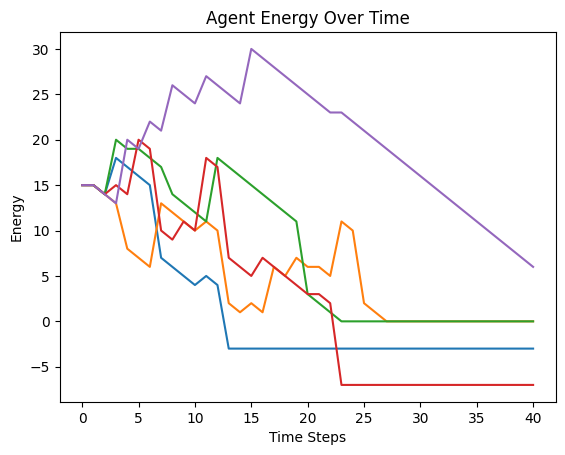

In [224]:
results = a.run()
energy_data = results["variables"]["MyAgent"]["energy"]
print("SS\n",results["variables"]["InteractionModel"]["reward"])
df = energy_data.reset_index()  
print("DataFrame for this run:")

plt.clf()
plt.figure()
for agent_id, agent_data in df.groupby("obj_id"):
    plt.plot(agent_data["t"], agent_data["energy"], label=f"Agent {agent_id}")

plt.xlabel("Time Steps")
plt.ylabel("Energy")
plt.title("Agent Energy Over Time")

plt.show()

total_rewards 38
Completed: 100 steps
Run time: 0:00:00.020105
Simulation finished


total_rewards 38
Completed: 100 steps
Run time: 0:00:00.012475
Simulation finished


total_rewards 36
Completed: 3 steps
Message from 4 to 6: Hey, since we both need to move, the one with the least energy should go
Sure, I have 15.0 energy left
You should move
Completed: 18 steps
Message from 4 to 6: Hey, since we both need to move, the one with the least energy should go
Sure, I have 6.0 energy left
You should move
Completed: 20 steps
Message from 6 to 4: Hey, since we both need to move, the one with the least energy should go
Sure, I have -4.0 energy left
I'll move
Completed: 22 steps
Message from 6 to 4: Hey, since we both need to move, the one with the least energy should go
Sure, I have -4.0 energy left
I'll move
Completed: 24 steps
Message from 6 to 4: Hey, since we both need to move, the one with the least energy should go
Sure, I have -4.0 energy left
I'll move
Completed: 25 steps
Message from 

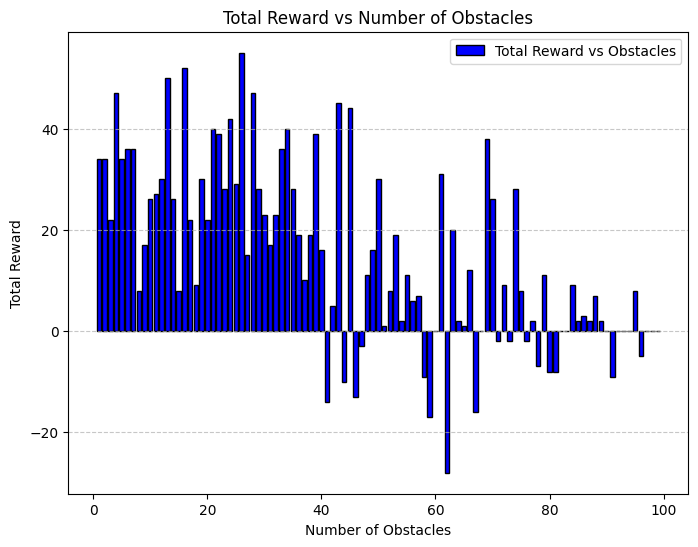

In [ ]:

reg_grid = np.array([[0.0, -5.0, 0.0, -4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 
                 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -7.0, 2.0, 6.0, 3.0], 
                 [0.0, 0.0, -7.0, 8.0, 0.0, 0.0, 2.0, 0.0, 7.0, 1.0], 
                 [-2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 5.0, 0.0, -7.0, 0.0], 
                 [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 1.0, -9.0, 0.0, 0.0], 
                 [0.0, 7.0, 0.0, -7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0], 
                 [8.0, 0.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0], 
                 [0.0, 4.0, 6.0, 0.0, -8.0, 7.0, 0.0, 0.0, 0.0, 3.0], 
                 [0.0, 8.0, 0.0, 0.0, 3.0, 9.0, -9.0, 0.0, 3.0, 1.0], 
                 [0.0, 0.0, 0.0, 7.0, -7.0, 0.0, 0.0, 0.0, 0.0, 0.0]])

results = []

for i in range(1,90):
    obstacles = i
    new_grid = add_obstacles(reg_grid, obstacles)
    parameters = {
        'steps': 100,
        'energy': 10,
        'grid': new_grid,
        'agent_count': 5,
        'obstacles': obstacles
    }
    
    model = InteractionModel(parameters=parameters)
    model.run()
    total = model.board.total_reward_value
    results.append((obstacles, total))
    print("\n")

obstacle_counts = [result[0] for result in results]
total_rewards = [result[1] for result in results]

plt.figure(figsize=(8, 6))
plt.bar(obstacle_counts, total_rewards, color='b', edgecolor='black', label='Total Reward vs Obstacles')

# Add labels, title, and grid
plt.xlabel('Number of Obstacles')
plt.ylabel('Total Reward')
plt.title('Total Reward vs Number of Obstacles')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)  # Grid lines for the y-axis

# Add legend
plt.legend()

# Display the plot
plt.show()

total_rewards 38
Completed: 100 steps
Run time: 0:00:00.007685
Simulation finished


total_rewards 38
Completed: 100 steps
Run time: 0:00:00.003341
Simulation finished


total_rewards 38

Message from 3 to 4: Hey, since we both need to move, the one with the least energy should go
Sure, I have 5 energy left
You should move
Completed: 100 steps
Run time: 0:00:00.004886
Simulation finished


total_rewards 38
Completed: 100 steps
Run time: 0:00:00.005743
Simulation finished


total_rewards 38
Completed: 100 steps
Run time: 0:00:00.007489
Simulation finished


total_rewards 38
Completed: 100 steps
Run time: 0:00:00.008972
Simulation finished


total_rewards 38

Message from 6 to 8: Hey, since we both need to move, the one with the least energy should go
Sure, I have 5 energy left
You should move
Completed: 5 steps
Message from 6 to 8: Hey, since we both need to move, the one with the least energy should go
Sure, I have 8.0 energy left
You should move
Completed: 14 steps
Message from 8 to 6

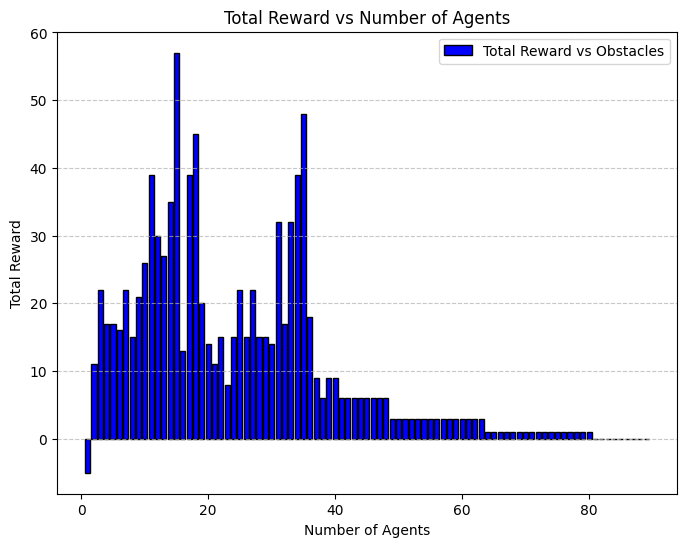

In [17]:

reg_grid = np.array([[0.0, -5.0, 0.0, -4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 
                 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -7.0, 2.0, 6.0, 3.0], 
                 [0.0, 0.0, -7.0, 8.0, 0.0, 0.0, 2.0, 0.0, 7.0, 1.0], 
                 [-2.0, 0.0, 0.0, 0.0, 2.0, 0.0, 5.0, 0.0, -7.0, 0.0], 
                 [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 1.0, -9.0, 0.0, 0.0], 
                 [0.0, 7.0, 0.0, -7.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0], 
                 [8.0, 0.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0], 
                 [0.0, 4.0, 6.0, 0.0, -8.0, 7.0, 0.0, 0.0, 0.0, 3.0], 
                 [0.0, 8.0, 0.0, 0.0, 3.0, 9.0, -9.0, 0.0, 3.0, 1.0], 
                 [0.0, 0.0, 0.0, 7.0, -7.0, 0.0, 0.0, 0.0, 0.0, 0.0]])

aa = add_obstacles(reg_grid, 7)
results = []

for i in range(1,90):
    parameters = {
        'steps': 100,
        'energy': 5,
        'grid': reg_grid.copy(),
        'agent_count': i,
        'obstacles': 10
    }
    
    model = InteractionModel(parameters=parameters)
    model.run()
    total = model.board.total_reward_value
    results.append((i, total))
    print("\n")

obstacle_counts = [result[0] for result in results]
total_rewards = [result[1] for result in results]

plt.figure(figsize=(8, 6))
plt.bar(obstacle_counts, total_rewards, color='b', edgecolor='black', label='Total Reward vs Obstacles')

# Add labels, title, and grid
plt.xlabel('Number of Agents')
plt.ylabel('Total Reward')
plt.title('Total Reward vs Number of Agents')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)  # Grid lines for the y-axis

# Add legend
plt.legend()

# Display the plot
plt.show()